In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import matplotlib.pyplot as plt

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/boatsv1/boats/vsmallfish/b865c2eabec630c652794a8b8a45c4e0.jpg
/kaggle/input/boatsv1/boats/coastguard/USCG_response_boat_medium_45607_Yorktown.jpg
/kaggle/input/boatsv1/boats/submarine/US_Navy_040730-N-1234E-002_PCU_Virginia_(SSN_774)_returns_to_the_General_Dynamics_Electric_Boat_shipyard.jpg
/kaggle/input/boatsv1/boats/cv/340-SpanishFly.jpg
/kaggle/input/boatsv1/boats/ferry/Normandie.jpg
/kaggle/input/boatsv1/boats/containership/Ever_Given_blocking_1.jpg
/kaggle/input/boatsv1/boats/sailing/23214343.jpg
/kaggle/input/boatsv1/boats/methanier/330px-Gaselys_mg_8839.jpg
/kaggle/input/boatsv1/boats/tug/RSD_Tug_2513_Senglea_01-p1zdyqncnogrv676mbkdn5pe0nv1cc26hb8njco81s.jpg
/kaggle/input/boatsv1/boats/corvette/zVETTEBOAT.0031.jpg
/kaggle/input/boatsv1/boats/smallfish/07a86359ccd84b341f314996a5175892.jpg
/kaggle/input/boatsv1/boats/cruiser/Webp.net-compress-image-18.jpg
/kaggle/input/boatsv1/boats/destroyer/5e189e58b2e66a64e56d4bb9.jpg
/kaggle/input/boatsv1/boats/destroyer/DDG_May

In [2]:
!tar xzf /kaggle/input/ships2021/ships2021.tgz

In [3]:
!ls train/

coastguard     corvette  cv	    ferry      sailing	  submarine  vsmallfish
containership  cruiser	 destroyer  methanier  smallfish  tug


# Table des matières
​
1. [Création du jeu de test](#section-one)
    1. [Affichage des images ajoutées](#subsection-13)
2. [Chargement des générateurs d'image](#section-two)
3. [Affichage des images après mise au format](#section-three)
4. [Réseau de neurones](#section-four)
    1. [Chargement d'un réseau de neurones avec les poids d'imagenet](#subsection-one)
    2. [Nombre de couches](#subsection-two)
    3. [Ajout d'un callback earlystopping (si le model perd en précision, l'apprentissage s'arrête et les meilleurs poids sont gardés)](#subsection-three)
    4. [Entraînement du modèle](#subsection-four)
    5. [Résultat sur le jeu de test](#subsection-five)
    6. [Évolution des résultats au fil des epochs](#subsection-six)
5. [Analyse des résultats](#section-five)
    1. [Rapport de classification](#subsection-seven)
    2. [Matrice de confusion](#subsection-eight)
    3. [Affichage des prédictions](#subsection-nine)
    4. [Grad-CAM](#subsection-ten)
6. [Résultat à soumettre](#section-six)
    1. [Histogramme des résultats](#subsection-11)

<a id="section-one"></a>
# Création du jeu de test 

Nous allons charger les données de ships2021 et ajouter d'autres images qu'on a trouvé sur internet

In [4]:
!mkdir test

In [5]:
!rm -rf test/*

In [6]:
!cp -r ../input/boatsv1/boats/* test/

<a id="subsection-13"></a>
## Affichage des images ajoutées

Elles sont ensuite mise au format du réseau grace au générateur (partie suivante)

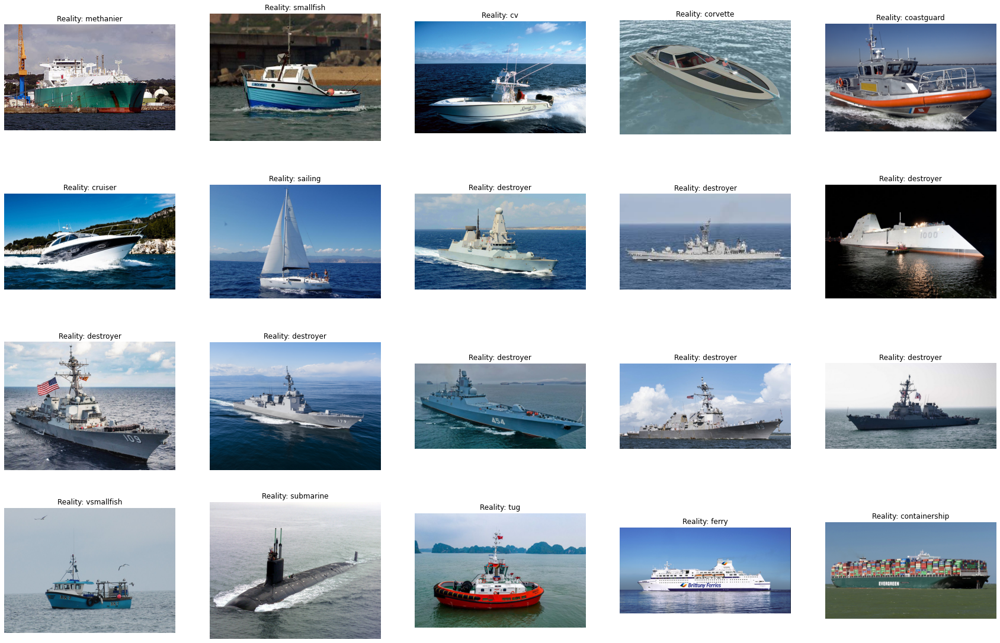

In [7]:
import glob
import matplotlib.image as mpimg

fig = plt.figure(figsize=(30,40))

# show 40 images from the test set
i = 0
for img in glob.glob("test/*/*.jpg"):
    i += 1
    fig.add_subplot(8, 5, i)
    image = mpimg.imread(img)
    plt.imshow(image)
    plt.axis('off')
    plt.title("Reality: {}".format(img.split("/")[1]))

In [8]:
from pathlib import Path

test_directory = Path("test/")

for directory in Path("train/").glob("*"):
    test_dir = test_directory.joinpath(directory.name)
    test_dir.mkdir(parents=True, exist_ok=True)
    images = [image for image in Path(directory).glob("*")]
    
    # Move the first 100 pictures in each category
    for image in images[:100]:
        image.rename(test_dir.joinpath(image.name))

In [9]:
!ls test/destroyer | cat | wc

    108     109    1088


<a id="section-two"></a>
# Chargement des générateurs d'image

In [10]:
batch_size = 64

In [11]:
from keras.preprocessing.image import ImageDataGenerator 

train_datagen = ImageDataGenerator(
        rescale=1./255,
        horizontal_flip=True,
        brightness_range=(0.3,0.8),
        width_shift_range=0.3,
        height_shift_range=0.2,
        zoom_range=0.5,
        channel_shift_range=90,
        rotation_range=20,
        validation_split=0.1)

train_generator = train_datagen.flow_from_directory(
        'train',
        target_size=(128, 192 ),
        batch_size=batch_size,
        shuffle=True,
        subset="training")

validation_generator = train_datagen.flow_from_directory(
        'train',
        target_size=(128, 192 ),
        batch_size=batch_size,
        shuffle=True,
        subset="validation")

test_generator = train_datagen.flow_from_directory(
        'test',
        target_size=(128, 192 ),
        shuffle=False,
        batch_size=batch_size)

Found 43402 images belonging to 13 classes.
Found 4815 images belonging to 13 classes.
Found 1320 images belonging to 13 classes.


<a id="section-three"></a>
# Affichage des images après mise au format

On crée une liste de labels pour avoir les différents noms de bateaux dans l'ordre.

In [12]:
print(test_generator.class_indices)

{'coastguard': 0, 'containership': 1, 'corvette': 2, 'cruiser': 3, 'cv': 4, 'destroyer': 5, 'ferry': 6, 'methanier': 7, 'sailing': 8, 'smallfish': 9, 'submarine': 10, 'tug': 11, 'vsmallfish': 12}


In [13]:
labels = []
for value in test_generator.class_indices:
    labels.append(value)

In [14]:
labels

['coastguard',
 'containership',
 'corvette',
 'cruiser',
 'cv',
 'destroyer',
 'ferry',
 'methanier',
 'sailing',
 'smallfish',
 'submarine',
 'tug',
 'vsmallfish']

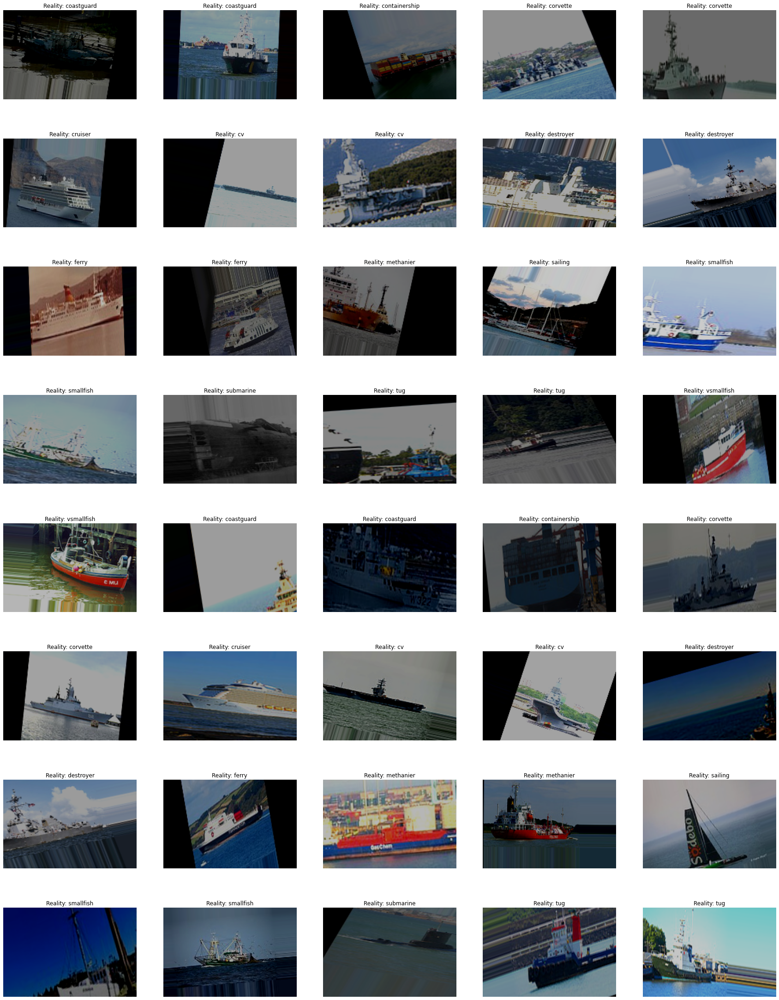

In [15]:
from random import randrange

fig = plt.figure(figsize=(30,40))

# show 40 images from the test set
for i in range(1, 41):
    fig.add_subplot(8, 5, i)
  
    img = next(test_generator)
    
    # choose a random image in the batch
    random_index = randrange(len(img[0]))
    plt.imshow(img[0][random_index])
    plt.axis('off')
    plt.title("Reality: {}".format(labels[img[1][random_index].argmax()]))

<a id="section-four"></a>
# Réseau de neurones

Nous avons choisi le réseau InceptionResNetV2 pour sa performance sur Imagenet et sa facilité d'accès car elle est déjà implémentée dans la bibliothèque Keras !

In [16]:
input_shape = (128, 192, 3)

<a id="subsection-one"></a>
## Chargement d'un réseau de neurones avec les poids d'imagenet

In [17]:
pretrained_model = tf.keras.applications.InceptionResNetV2(
    include_top=False,
    weights="imagenet",
    input_tensor=None,
    input_shape=input_shape,
    pooling="avg"
)

219062272/219055592 [==============================] - 2s 0us/step


In [18]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(13, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01,momentum=0.9),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


<a id="subsection-two"></a>
## Nombre de couches

In [19]:
print(len(model.layers))

784


<a id="subsection-three"></a>
## Ajout d'un callback earlystopping (si le model perd en précision, l'apprentissage s'arrête et les meilleurs poids sont gardés)

In [20]:
earlystopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=10,
    verbose=1,
    mode='auto',
    baseline=None,
    restore_best_weights=True
)

<a id="subsection-four"></a>
## Entraînement du modèle

In [21]:
model_history = model.fit(train_generator, validation_data=validation_generator, epochs=3, shuffle=True, callbacks=[earlystopping])

Epoch 1/3
679/679 [==============================] - 454s 640ms/step - loss: 1.3605 - accuracy: 0.5402 - val_loss: 0.7423 - val_accuracy: 0.7454
Epoch 2/3
679/679 [==============================] - 430s 633ms/step - loss: 0.5744 - accuracy: 0.7955 - val_loss: 0.5760 - val_accuracy: 0.7904
Epoch 3/3
679/679 [==============================] - 432s 635ms/step - loss: 0.4720 - accuracy: 0.8312 - val_loss: 0.5176 - val_accuracy: 0.8050


In [22]:
model.save_weights('model.hdf5')

In [23]:
from IPython.display import FileLink
FileLink(r'model.hdf5')

/kaggle/working/model.hdf5

<a id="subsection-five"></a>
## Résultat sur le jeu de test

In [24]:
score = model.evaluate(test_generator, verbose=0)
print('Test score:', score[0])
print('Test accuracy:', score[1])

Test score: 0.664986789226532
Test accuracy: 0.7636363506317139


<a id="subsection-six"></a>
## Évolution des résultats au fil des epochs

On regarde les différentes clés qui se trouvent dans l'historique

In [25]:
print(model_history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


### Affichage de l'accuracy

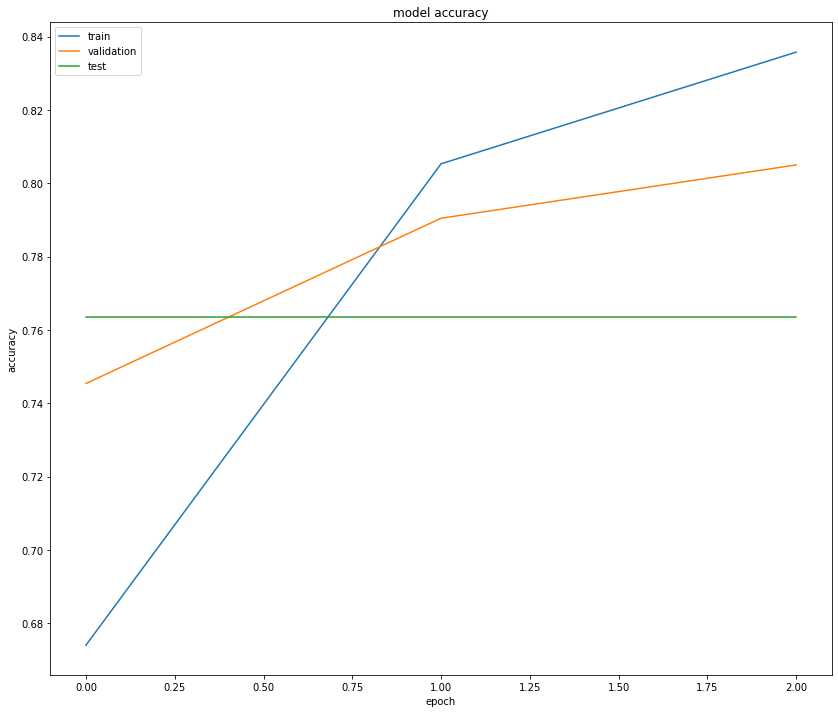

In [26]:
plt.figure(figsize=(14,12))
plt.plot(model_history.history['accuracy'])
plt.plot(model_history.history['val_accuracy'])
plt.plot([score[1]] * len(model_history.history['accuracy']))
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation', 'test'], loc='upper left')
plt.show()

### Affichage du loss

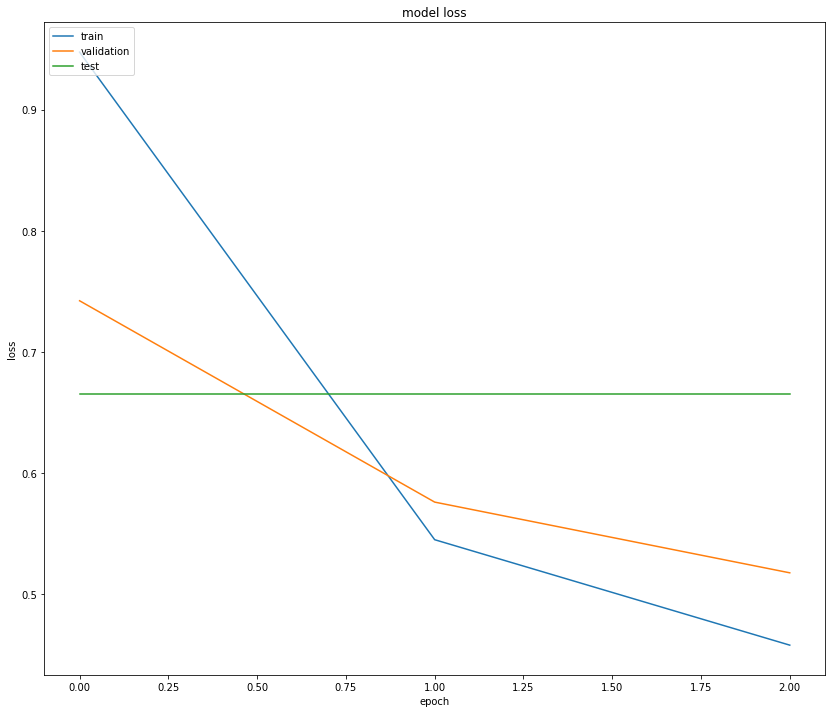

In [27]:
plt.figure(figsize=(14,12))
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.plot([score[0]] * len(model_history.history['loss']))
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation', 'test'], loc='upper left')
plt.show()

<a id="section-five"></a>
# Analyse des résultats

In [28]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

In [29]:
y_pred = model.predict(test_generator).argmax(axis=1)

In [30]:
y_pred

array([12,  5, 12, ..., 12, 12, 12])

<a id="subsection-seven"></a>
## Rapport de classification

Un classification report nous donne plusieurs informations :
* precision : La précision indique le pourcentage des prédictions correspondant à la vérité terrain (vrai positif / total).
* recall : Le Recall est le fait de trouver toutes les instances positives. Pour chaque classe c'est défini par le calcul du ratio des vrais positifs sur la somme des vrais positifs et des faux négatifs.
* f1-score : Le f1-score est un score pondéré utilisant la precision et le recall. La formule est la suivante :
$$F1 Score = 2*(Recall * Precision)\ / \ (Recall + Precision)$$
* support : Le nombre d'images utilisés pour cette catégorie

In [31]:
print(classification_report(test_generator.classes, y_pred))

              precision    recall  f1-score   support

           0       0.78      0.63      0.70       101
           1       0.88      0.94      0.91       101
           2       0.81      0.54      0.65       101
           3       0.98      0.97      0.98       101
           4       0.93      0.69      0.80       101
           5       0.55      0.94      0.69       108
           6       0.78      0.89      0.83       101
           7       0.95      0.77      0.85       101
           8       0.95      0.94      0.95       101
           9       0.78      0.14      0.24       101
          10       0.76      0.87      0.81       101
          11       0.87      0.74      0.80       101
          12       0.46      0.83      0.59       101

    accuracy                           0.76      1320
   macro avg       0.81      0.76      0.75      1320
weighted avg       0.80      0.76      0.75      1320



<a id="subsection-eight"></a>
## Matrice de confusion

La matrice de confusion est une matrice qui mesure la qualité d'un système de classification. Chaque ligne correspond à une classe réelle, chaque colonne correspond à une classe estimée.

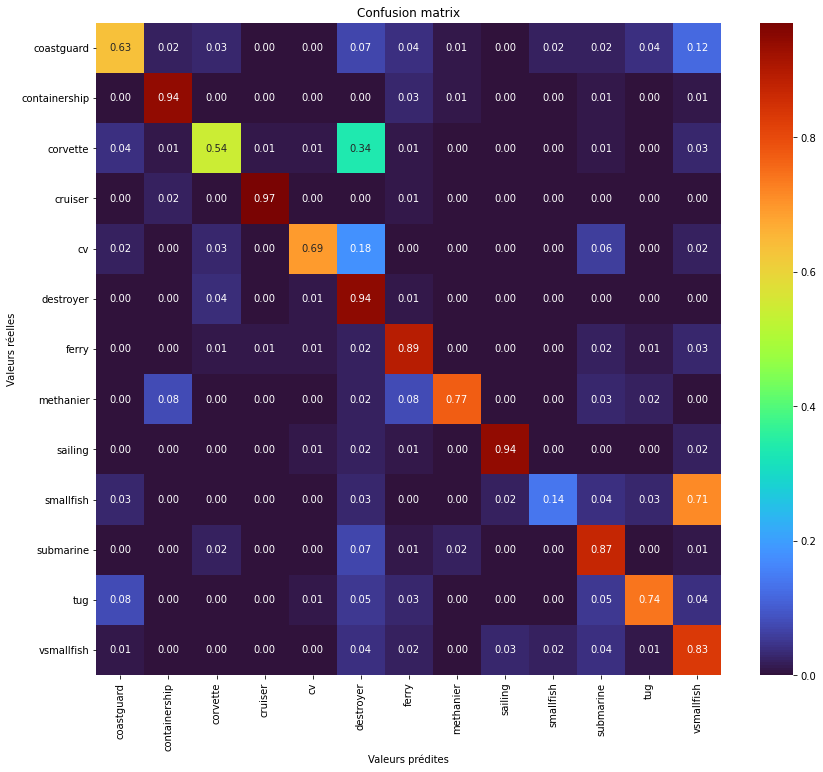

In [32]:
cf_matrix = confusion_matrix(test_generator.classes, y_pred, normalize='true')
plt.figure(figsize=(14,12))
plt.title("Confusion matrix")

sns.heatmap(cf_matrix,
            annot=True,
            fmt='.2f',
            cmap='turbo', 
            xticklabels=sorted(set(test_generator.class_indices)),
            yticklabels=sorted(set(test_generator.class_indices)))

plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.show()

<a id="subsection-nine"></a>
## Affichage des prédictions

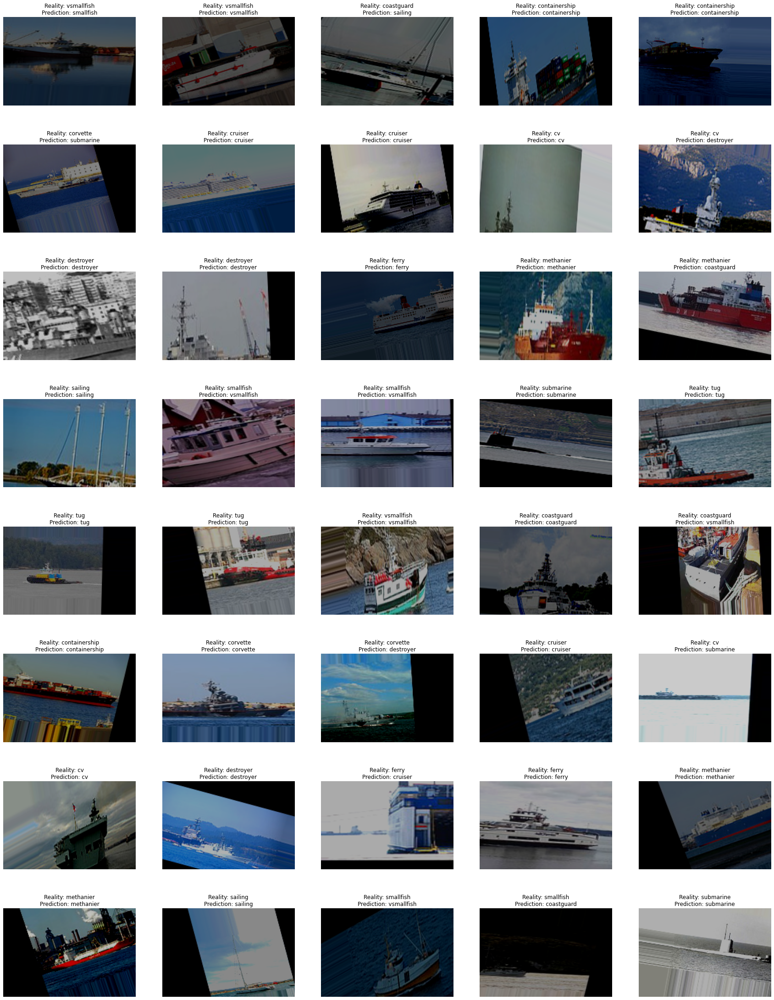

In [33]:
from random import randrange

fig = plt.figure(figsize=(30,40))

# show 40 images from the test set
for i in range(1, 41):
    fig.add_subplot(8, 5, i)
  
    img = next(test_generator)
    
    # choose a random image in the batch
    random_index = randrange(len(img[0]))
    plt.imshow(img[0][random_index])
    plt.axis('off')
    plt.title("Reality: {}\nPrediction: {}".format(labels[img[1][random_index].argmax()], labels[model.predict(img[0])[random_index].argmax()]))

<a id="subsection-ten"></a>
## Grad-CAM
Grad-Cam utilise les informations de gradient qui entrent dans la dernière couche convolutive du réseau pour comprendre le rôle de chaque neurone dans la décision finale.

In [34]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm

Les fonctions pour le Grad-CAM viennent de https://keras.io/examples/vision/grad_cam/

In [35]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [36]:
def create_gradcam(img, heatmap, alpha=0.4):
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Display Grad CAM
#     display(Image(cam_path))
    
    return superimposed_img

global_average_pooling2d


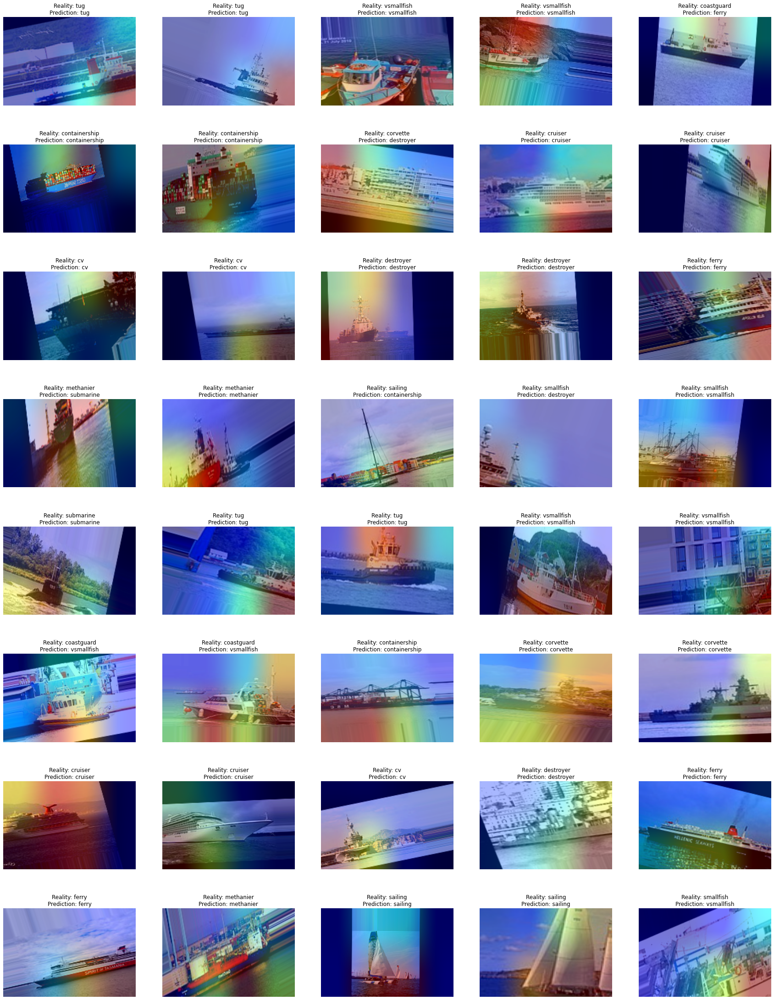

In [37]:
from random import randrange


# Remove last layer's softmax
model.layers[-1].activation = None

last_conv_layer_name = model.layers[-5].name
print(model.layers[-4].name)

fig = plt.figure(figsize=(30,40))

# show 40 images from the test set
for i in range(1, 41):
    fig.add_subplot(8, 5, i)
  
    image = next(test_generator)
    random_index = randrange(len(image[0]))
    img = image[0][random_index]
    
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)

    preds = model.predict(img)
    heatmap = make_gradcam_heatmap(img, model, last_conv_layer_name)
    superimposed_img = create_gradcam(img[0], heatmap, 0.0015)
    
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.title("Reality: {}\nPrediction: {}".format(labels[image[1][random_index].argmax()], labels[preds.argmax()]))

<a id="section-six"></a>
# Résultat à soumettre

In [38]:
X_test = np.load('test_rot.npy', allow_pickle=True)
X_test = X_test.astype('float32') / 255

<a id="subsection-11"></a>
## Histogramme des résultats

In [39]:
res = model.predict(X_test).argmax(axis=1)
df = pd.DataFrame({"Category":res})
df.to_csv("reco_nav.csv", index_label="Id")

<AxesSubplot:>

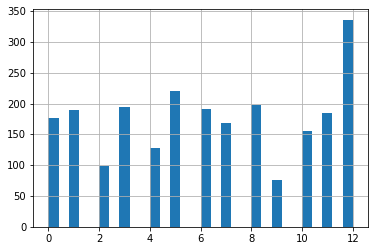

In [40]:
df.Category.hist(bins=30)

In [41]:
!head reco_nav.csv

Id,Category
0,12
1,9
2,2
3,0
4,12
5,1
6,0
7,1
8,12


In [42]:
from IPython.display import FileLink
FileLink(r'reco_nav.csv')

/kaggle/working/reco_nav.csv

In [43]:
!rm -rf train/